# Spatial Central Tendency

## Pengantar — Apa itu Spatial Central Tendency

Spatial central tendency adalah konsep untuk menemukan "titik pusat" dari sebaran titik (atau fitur) di ruang. Tujuannya memberi ringkasan geometris tentang lokasi rata-rata atau lokasi representatif dari sekumpulan titik (mis. rumah, sekolah, pusat kegiatan). Tiga konsep yang sering dipakai di GIS/Geografi/Perencanaan adalah **Mean Center**, **Median Center (geometric median / Weber point)**, dan **Central Feature (medoid / central feature)**. Masing-masing mempunyai definisi matematis, sifat berbeda (robustness terhadap pencilan), metode komputasi, dan aplikasi praktis.

## 1. Mean Center (titik rata-rata / centroid titik)

**Definisi (Euclidean, tak berbobot).**  
Mean center adalah rata-rata aritmetik dari koordinat titik:

$$\bar{x} = \frac{1}{n}\sum_{i=1}^n x_i, \quad \bar{y} = \frac{1}{n}\sum_{i=1}^n y_i$$

Dengan bobot $w_i$ (mis. populasi), versi berbobot:

$$\bar{x}_w = \frac{\sum_i w_i x_i}{\sum_i w_i}, \quad \bar{y}_w = \frac{\sum_i w_i y_i}{\sum_i w_i}$$

**Interpretasi matematis.**  
Mean center adalah minimizer dari jumlah kuadrat jarak Euclidean:

$$\arg\min_{(x,y)} \sum_{i=1}^n w_i ((x_i - x)^2 + (y_i - y)^2)$$

**Sifat.**

- Mudah dihitung (kompleksitas O(n)).
- Sensitif terhadap outlier (karena kuadrat).
- Bisa dipakai sebagai *center of mass* (analog massa/gravitasi).

**Contoh aplikasi.**

- Menunjukkan pusat massa penduduk pada data sensus (perpindahan pusat populasi).
- Analisis perubahan lokasi pusat aktivitas waktu ke waktu.
- Inisialisasi algoritma k-means (sebagai centroid awal).
- Visualisasi ringkasan lokasi (sering dikomplementasi dengan *standard distance*).


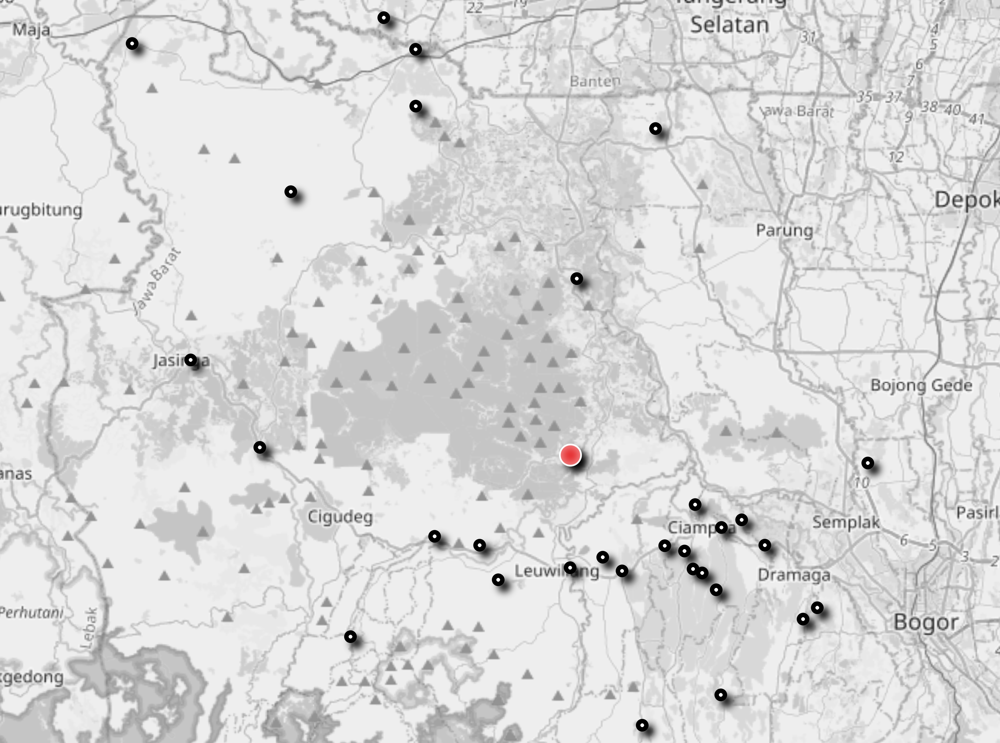

Titik merah menunjukkan mean-center.

## 2. Median Center — Geometric Median / Masalah Weber

**Definisi.**  
Median center adalah titik yang meminimalkan jumlah jarak linear:

$$\arg\min_{(x,y)} \sum_{i=1}^n w_i \, d((x,y),(x_i,y_i))$$

dengan $d(\cdot,\cdot)$ biasanya jarak Euclidean. Tidak ada bentuk tertutup umum — harus diselesaikan numerik.

**Algoritma populer — Weiszfeld’s algorithm.**  
Iteratif, dimulai dari tebakan awal (mis. mean center), lalu update hingga konvergen.

**Sifat.**

- Meminimalkan jumlah jarak (L1 objective).
- Lebih robust terhadap outlier dibanding mean center.
- Hasil biasanya bukan merupakan titik data (bisa di antara titik).
- Komputasi iteratif (O(n·iter)).

**Contoh aplikasi.**

- Menempatkan fasilitas untuk meminimalkan total perjalanan (rumah sakit, pusat distribusi).
- Model lokasi satu fasilitas (1-median).
- Analisis mobilitas/pusat aktivitas.


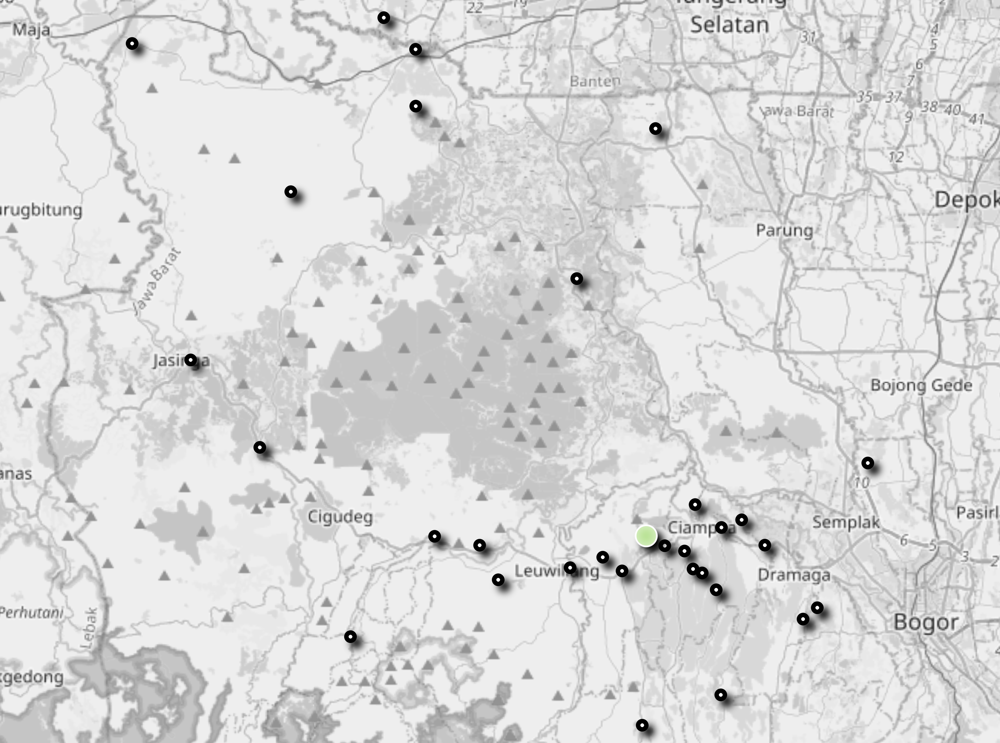

Titik hijau menunjukkan median center.

## 3. Central Feature (Medoid / Fitur Sentral)

**Definisi.**  
Central feature memilih satu fitur aktual dalam dataset sebagai representatif — fitur $p_k$ yang meminimalkan 
jumlah jarak ke semua fitur lain:

$$p^* = \arg\min_{p_k \in \{p_1,\dots,p_n\}} \sum_{i=1}^n d(p_k, p_i)$$

**Sifat.**

- Hasil pasti adalah titik/fitur aktual (berguna jika butuh lokasi nyata).
- Dihitung dengan memeriksa semua kandidat → O(n^2).
- Lebih robust dibanding mean center, tapi tetap dipengaruhi komposisi data.

**Contoh aplikasi.**

- Pemilihan lokasi nyata yang representatif (mis. kantor kecamatan terpusat).
- Clustering: k-medoids (PAM).
- Visualisasi lokasi representatif dari cluster.


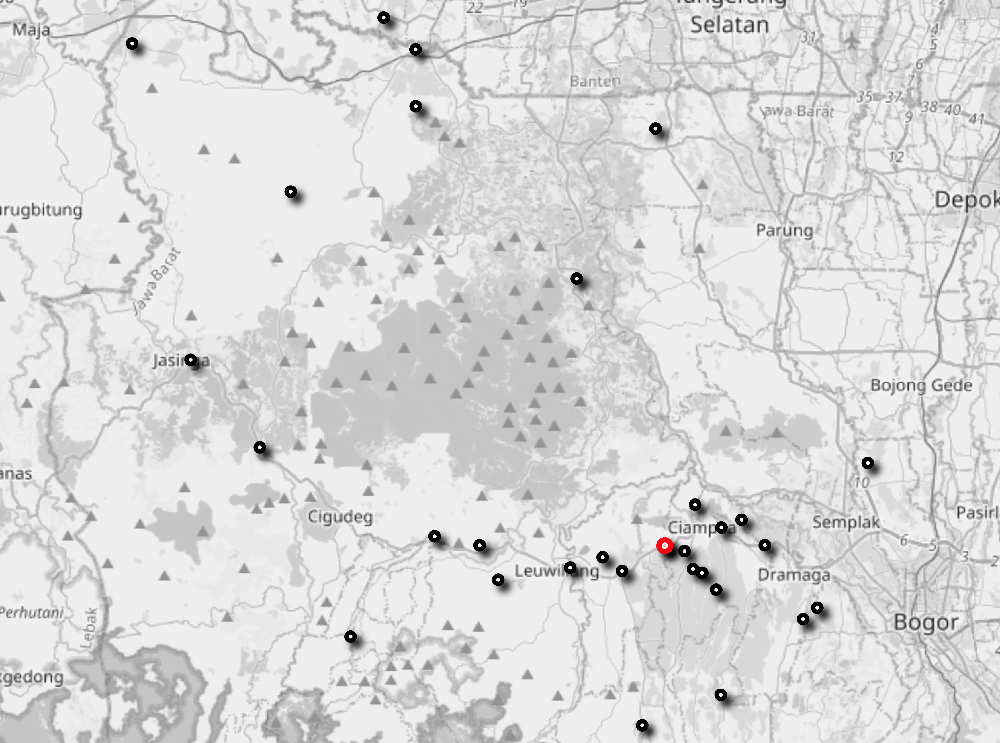

Titik merah menunjukkan central feature.

## 4. Perbandingan dan Rekomendasi

- **Mean center** → cepat, cocok untuk ringkasan posisi (pusat massa).  
- **Median center** → minimalkan total perjalanan, lebih robust.  
- **Central feature** → pilih lokasi nyata representatif.  

Jika tujuan adalah minimalkan jarak terjauh (worst-case), gunakan **1-center/minimax**. 


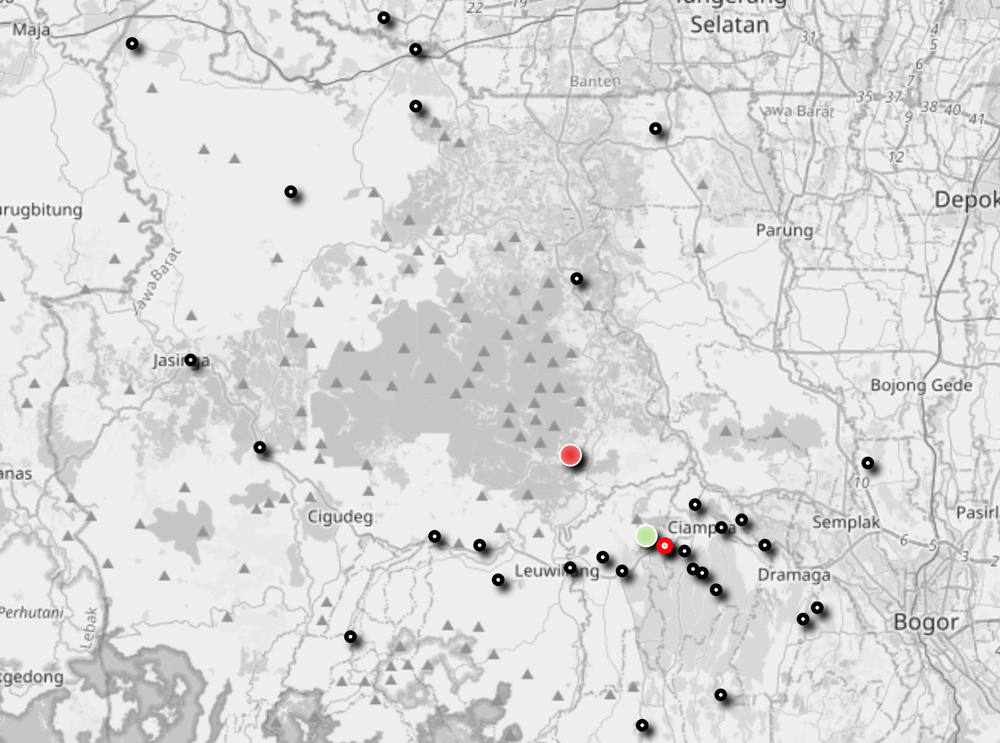

## 5. Contoh Numerik Singkat

Titik: A(0,0), B(2,0), C(0,2), D(10,10)

- Mean center: (3,3)
- Median center (geometric median, approx): (1,1)
- Central feature: B atau C (sama-sama minimalkan jumlah jarak)


## 6. Aplikasi di Geografi & Perencanaan Wilayah

- **Perencanaan fasilitas:** geometric median untuk puskesmas, depot, dsb.
- **Analisis perubahan spasial:** mean center populasi tiap dekade.
- **Logistik & distribusi:** pemilihan gudang pusat.
- **Pemilihan lokasi representatif:** central feature.
- **Manajemen bencana:** analisis titik pusat kebutuhan & distribusi material.


## 7. Catatan Tambahan

- Gunakan CRS proyeksi metrik (UTM / equal-area) sebelum perhitungan.  
- Tambahkan ukuran penyebaran (standard distance, ellipse).  
- Perhatikan outliers & skala data (MAUP).  
